# The Nexus of a Diamond’s Clarity, Carat & Price

### Introduction

Diamonds are a girl's best friend. But how did the modern Diamond industry come to be? Diamonds were originally from India, where only select royalty had possession. In the early 20th century, major diamond mines were discovered in South Africa. This paired with Marcel Tolkowsky’s 1919 inventive diamond cutting technique that enchanted the brilliance and sparkle of diamonds, increased both supply and customer interest. Later in 1947, a British Company called De Beers launched a campaign that revolutionized the diamond industry. It was called “A Diamond is Forever'', to target people in love to show commitment to one another. At first, royalty and public figures devoured this new trend, making diamonds more than a symbol of eternal commitment, but also a symbol of status, luxury, and wealth. Thus, the classic ‘Diamond Wedding Ring’ phenomenon arose and swiftly spread across the world. With that a new social norm was born, and the demand for the diamonds skyrocketed. 
This demand has cost thousands of people their lives as companies like De Beer continued to exploit the labour of locals to meet rising demands. This included hazardous working conditions, inadequate safety measures, and, in some cases, involvement in violent conflicts where “blood diamonds” were used to fund wars, leading to widespread suffering and death in Africa. This inhumane industry continues to operate to this day. However, the majority of diamonds are now being synthesized/man-made or more ethically sourced (there's a diamond mine in Canada now), offering a more ethical and sustainable alternative that doesn't contribute to the exploitation and violence associated with traditional diamond mining in Africa. 

<br>The price of diamonds has ranged from royalty-only to stable for the modern middle class and up to a monogamous relationship. Besides supply and demand, there are two factors or properties of a diamond that greatly influence this price: carat and clarity. A diamond’s carat refers to its weight (one carat is equivalent to 0.2 grams). On the other hand, a diamond’s clarity refers to how clear it is. Diamonds often have cracks, scratches and imperfections, furthermore, diamonds with fewer imperfections have a higher clarity. Clarity is measured in 8 ordered levels from I1 (worst) to IF (best).

<br> The dataset used in this project is titled “Diamonds: Predict diamond price based on features such as carat/cut/colour/clarity/size”. This dataset contains information on the range of different carat and clarity classification identifiers used in the diamond/jewelry industry; this will help us determine how carat and clarity impact the price of a diamond. 
- Carat is a measure of diamond weight. One carat is equivalent to 0.2 grams.
- Clarity refers to how clear a diamond is. Diamonds often contain imperfections like cracks or mineral deposits. The fewer and less noticeable a diamond’s imperfections, the better its clarity. clarity contains 8 ordered levels, from “I1” (the worst) to “IF” (the best).
- Color refers to the color of the diamond. Colorless diamonds are considered better than diamonds with a yellow tint. diamonds contains diamonds of 7 different colors, represented by different letters. “D” - “F” diamonds are considered colorless, while “G” - “J” diamonds have a very faint color.
- Cut refers to how a rough diamond is shaped into a finished diamond. Better cuts create more symmetrical and luminous diamonds. cut has 5 ordered levels: “Fair,” “Good,” “Very Good,” “Premium,” “Ideal.”
- x, y, z, depth, and table are various measures of a diamond’s size, in millimeters.

<br> The research question we are asking is “How does the carat & clarity of a diamond predict the price?” We chose to use carat as a predictor because since weight = mass = how much diamond someone is getting. Thus we can predict that carat should have a positive  relationship with the price. The other predictor we are going to use is the clarity of the diamond. Since clarity deals with the purity of the diamond, we can also infer that the purer a diamond is, the higher value the consumers will place on the diamond, thus giving clarity a positive relationship with price as well. 

### Preliminary exploratory data analysis

In [1]:
library(tidyverse)
library(tidymodels)
install.packages("kknn")
library(repr)
library(readxl)

set.seed(5)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

In [2]:
diamond <- read_csv("https://raw.githubusercontent.com/jeevaniputri/diamonds/main/diamonds.csv")

Rows: 53940 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): cut, color, clarity
dbl (7): carat, depth, table, price, x, y, z

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [3]:
diamonds <- diamond |>
            slice(seq(from=1, to=nrow(diamonds), by=5)) |>
            mutate(clarity = recode(clarity, "I1"=1, "SI2"=2, "SI1"=3, "VS2"=4, "VS1"=5, "VVS2"=6, "VVS1"=7, "IF"=8))
diamonds

carat,cut,color,clarity,depth,table,price,x,y,z
<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43
0.24,Very Good,J,6,62.8,57,336,3.94,3.96,2.48
0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73
0.32,Premium,E,1,60.9,58,345,4.38,4.42,2.68
0.30,Good,I,2,63.3,56,351,4.26,4.30,2.71
0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41
0.23,Very Good,F,5,60.0,57,402,4.00,4.03,2.41
0.23,Good,F,5,58.2,59,402,4.06,4.08,2.37
0.33,Ideal,I,2,61.2,56,403,4.49,4.50,2.75


In [4]:
diamonds_split <- initial_split(diamonds, prop = 0.75, strata = price)
diamonds_train <- training(diamonds_split)
diamonds_test <- testing(diamonds_split)

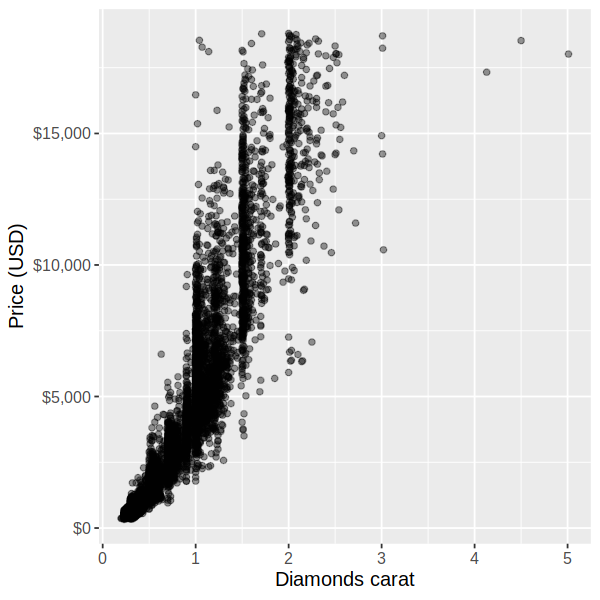

In [5]:
options(repr.plot.width = 5, repr.plot.height = 5)
plot_carat <- ggplot(diamonds_train, aes(x = carat, y = price)) +
              geom_point(alpha = 0.4) +
              xlab("Diamonds carat") +
              ylab("Price (USD)") +
              scale_y_continuous(labels = dollar_format()) + 
              theme(text = element_text(size = 12))
plot_carat

Visualize the clarity vs price as a scatterplot

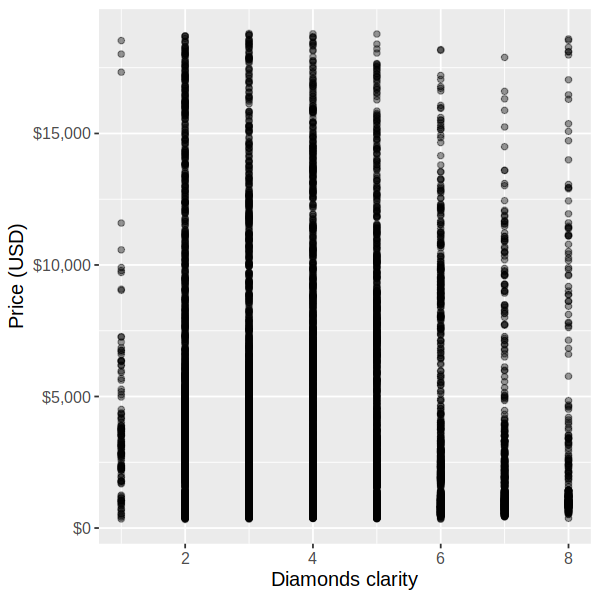

In [6]:
options(repr.plot.width = 5, repr.plot.height = 5)
clarity_plot <- ggplot(diamonds, aes(x = clarity, y = price)) +
                geom_point(alpha = 0.4) +
                xlab("Diamonds clarity") +
                ylab("Price (USD)") +
                scale_y_continuous(labels = dollar_format()) + 
                theme(text = element_text(size = 12))
clarity_plot

We can see that as the carat and clarity of a diamond increases, so does its price. Thus, we can reason that we may be able to use the carat and the clarity to predict the price.

In [7]:
clarity_summary <- diamonds |>
    group_by(clarity) |>
    summarize(mean_price = mean(price))
clarity_summary

clarity,mean_price
<dbl>,<dbl>
1,3921.224
2,5030.108
3,3959.451
4,3954.028
5,4029.872
6,3203.251
7,2294.862
8,2895.908


It does not appear as though there is a clear relationship between the clarity of a diamonds and its price from the given graph and means calculated above. However, I believe that this data may be a misrepresentation of the true nature of how clarity affects the price since the weight of the diamond also plays a large role in the value of the diamond. Thus, we will next try dividing the clarity of the diamond and the weight to see if this gives us a clearer relationship.

clarity,mean_multiplier
<dbl>,<dbl>
1,0.9783036
2,2.4107794
3,4.7492261
4,6.9623909
5,9.3319648
6,13.4785327
7,17.7289259
8,19.8185322


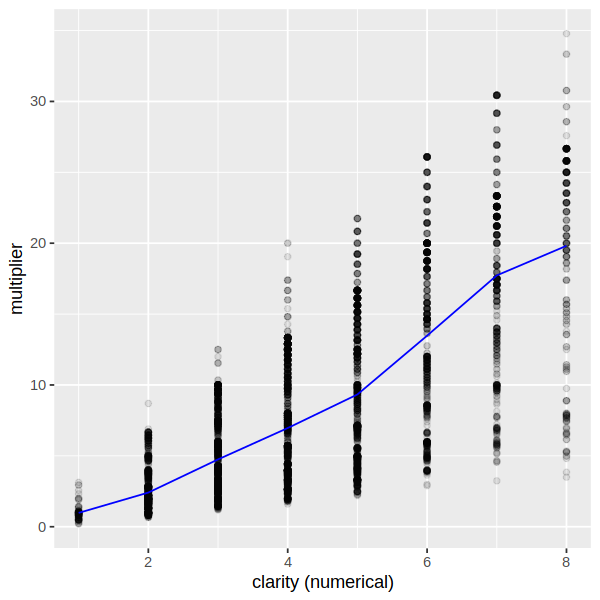

In [64]:
scaled_train <- diamonds_train |>
    mutate(clarity.scaled = clarity/carat)
scaled_test <- diamonds_test |>
    mutate(clarity.scaled = clarity/carat)
clar_scaled_summary <- scaled_train |>
    group_by(clarity) |>
    summarize(mean_multiplier = mean(clarity.scaled))
clar_scaled_summary
clarity_plot <- ggplot(scaled_train, aes(clarity, clarity.scaled)) + geom_point(alpha = 0.1) +
geom_line(data = clar_scaled_summary,
          mapping = aes(clarity, mean_multiplier),
          color = "blue") + 
labs(x = "clarity (numerical)", y = "multiplier")
clarity_plot

From this graph, we can see that although the price is more spread the higher the clarity value is, there is still a clear positive relationship between the clarity and price. By taking the mean of the data, we can find the average multiplier that is applied on any diamonds given its clarity value. For example, if a diamonds has a clarity value of 6, then we can expect its given price to be multiplied 13.49 times. 

Let's split it into train and test

### Methods & Results

In [55]:
diamonds_spec <- nearest_neighbor(weight_func = "rectangular", 
                                  neighbors = tune()) |>
                 set_engine("kknn") |>
                 set_mode("regression")

diamonds_recipe <- recipe(price ~ carat, data = scaled_train) |>
                   step_scale(all_predictors()) |>
                   step_center(all_predictors())
diamonds_recipe

Recipe

Inputs:

      role #variables
   outcome          1
 predictor          1

Operations:

Scaling for all_predictors()
Centering for all_predictors()

In [57]:
diamonds_vfold <- vfold_cv(scaled_train, v = 5, strata = price)

diamonds_workflow <- workflow() |>
                  add_recipe(diamonds_recipe) |>
                  add_model(diamonds_spec)
diamonds_workflow

══ Workflow ════════════════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-Nearest Neighbor Model Specification (regression)

Main Arguments:
  neighbors = tune()
  weight_func = rectangular

Computational engine: kknn 


In [58]:
gridvals <- tibble(neighbors = seq(from = 1, to = 100, by = 5))

diamonds_results <- diamonds_workflow |>
                  tune_grid(resamples = diamonds_vfold, grid = gridvals) |>
                  collect_metrics()


In [59]:
diamonds_min <- diamonds_results |>
                filter(.metric == "rmse") |>
                filter(mean == min(mean))
diamonds_min

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
96,rmse,standard,1467.806,5,20.39452,Preprocessor1_Model20


In [60]:
diamonds_k <- diamonds_min |>
              pull(neighbors)

diamonds_spec <- nearest_neighbor(weight_func = "rectangular", 
                              neighbors = diamonds_k) |>
                 set_engine("kknn") |>
                 set_mode("regression")

diamonds_best_fit <- workflow() |>
                     add_recipe(diamonds_recipe) |>
                     add_model(diamonds_spec) |>
                     fit(data = scaled_train)

diamonds_summary <- diamonds_best_fit |>
                  predict(scaled_test) |>
                  bind_cols(scaled_test) |>
                  metrics(truth = price, estimate = .pred)
diamonds_summary

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,1514.616003
rsq,standard,0.871261
mae,standard,859.495527


.pred,carat,cut,color,clarity,depth,table,price,x,y,z,clarity.scaled
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
504.1146,0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43,8.695652
583.6979,0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73,10.000000
624.4583,0.32,Premium,E,1,60.9,58,345,4.38,4.42,2.68,3.125000
583.6979,0.30,Good,I,2,63.3,56,351,4.26,4.30,2.71,6.666667
504.1146,0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41,26.086957
504.1146,0.23,Very Good,F,5,60.0,57,402,4.00,4.03,2.41,21.739130
683.8854,0.33,Ideal,I,2,61.2,56,403,4.49,4.50,2.75,6.060606
565.7917,0.29,Premium,F,3,62.4,58,403,4.24,4.26,2.65,10.344828
504.1146,0.24,Very Good,F,3,60.9,61,404,4.02,4.03,2.45,12.500000


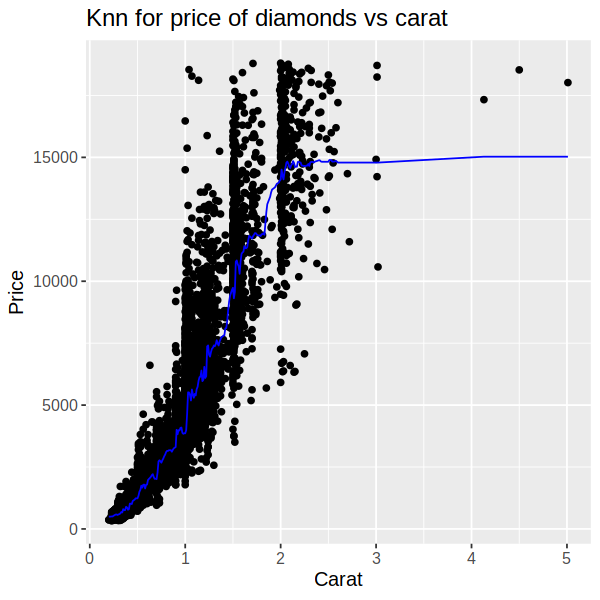

In [61]:
options(repr.plot.width = 5, repr.plot.height = 5)
diamonds_preds <- diamonds_best_fit |>
                  predict(scaled_train) |>
                  bind_cols(scaled_train)
diamonds_preds
diamonds_plot <- ggplot(diamonds_preds, aes(x = carat, y = price)) +
                 geom_point() +
                 geom_line (data = diamonds_preds, 
                            mapping = aes(x = carat, y = .pred), 
                            color = "blue") +
                 xlab("Carat") +
                 ylab("Price") +
                 ggtitle("Knn for price of diamonds vs carat") +
                 theme(text = element_text(size = 12))

diamonds_plot

### Discussion

### References